# <font color='#F5DEB3'>1. Подключение библиотек, загрузка данных

*Задание на лабораторную работу №2*

Нужно построить траекторию движения камеры по нескольким изображениям одного объекта (со смещением), выполнив следующие пункты:
- Определите на каждой фотографии ключевые точки.
- Постройте по каждой точке дескриптор (можете использовать любой, рекомендуется SIFT)
- Сопоставьте два соседних изображения на предмет соответствия ключевых точек.
- Постройте модель преобразования изображений, учитывайте только поворот и сдвиг.
- С учетом полученных моделей постройте траекторию движения камеры.

In [106]:
!pip install opencv-python

In [107]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [108]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

from google.colab.patches import cv2_imshow

## Чтение и запись изображений

In [109]:
# Чтение изображения c Google Colab
#   path - ссылка/путь файла;
#   scale - цвет изображения (0 - градация серого, 1 - цветное).
def read_image(path, scale) -> np.ndarray:

    image = cv2.imread(path, scale)
    # если нет изображения, то ошибка
    if image is None:
        raise ValueError("Изображение не найдено")

    cv2_imshow(image)    # вывод изображения

    return image

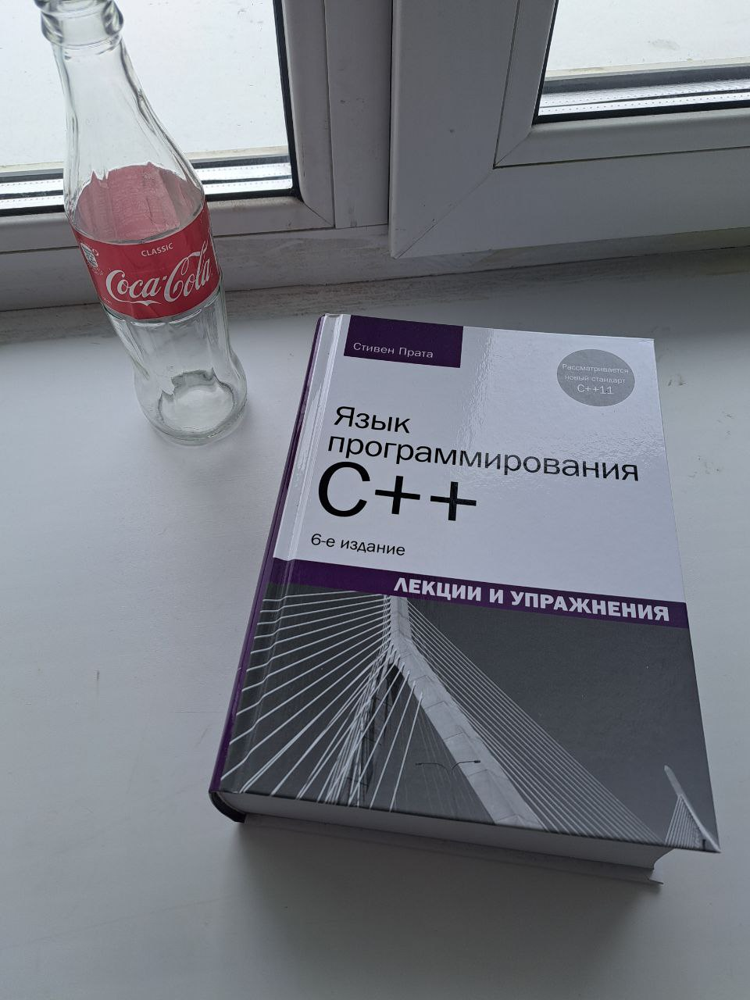

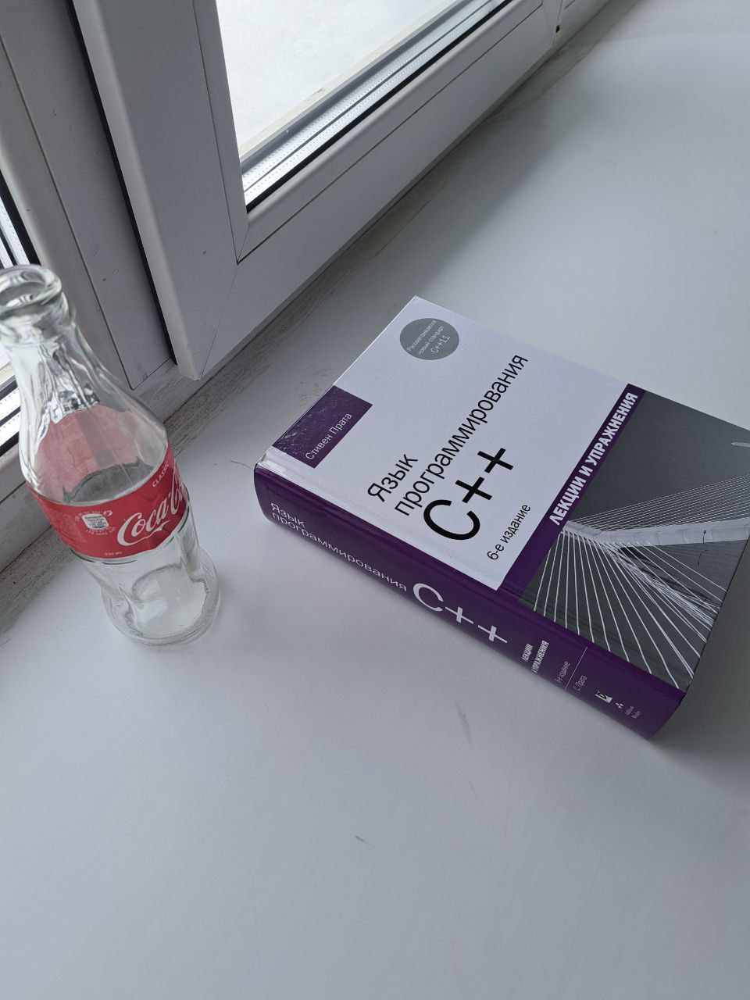

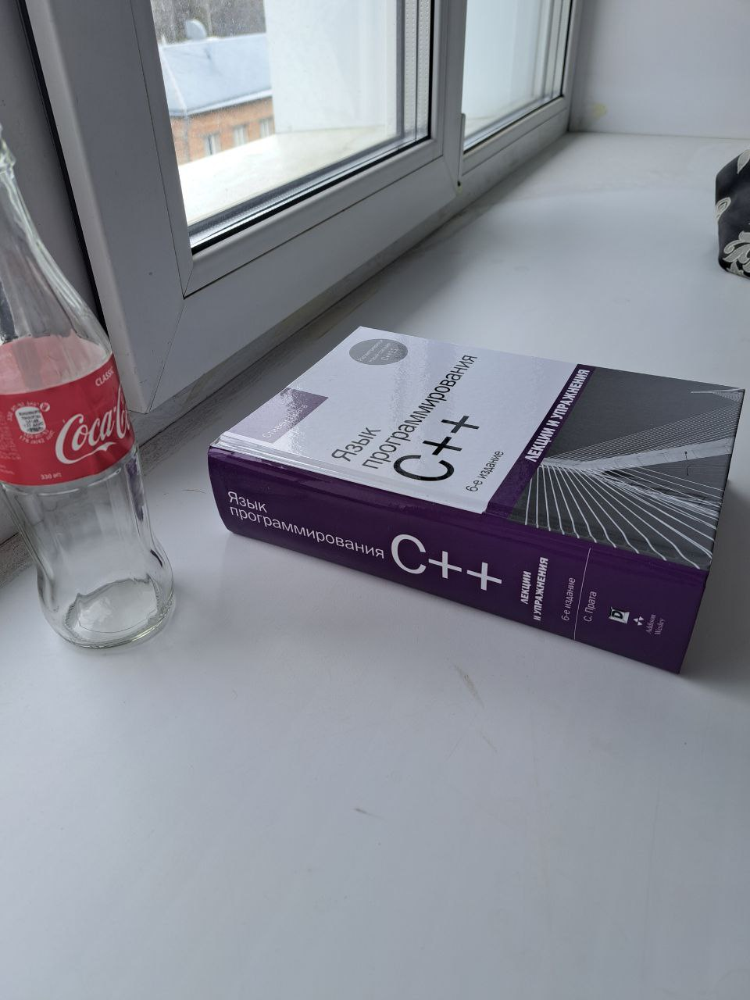

In [110]:
images_paths = (
    '/content/drive/MyDrive/Colab Notebooks/CV_LAB2_DATA/photo_1.jpg',
    '/content/drive/MyDrive/Colab Notebooks/CV_LAB2_DATA/photo_2.jpg',
    '/content/drive/MyDrive/Colab Notebooks/CV_LAB2_DATA/photo_3.jpg'
)
source_images = []
for path in images_paths:
    source_images.append(read_image(path, 1).copy())

array([[[227, 234, 240],
        [229, 236, 242],
        [230, 237, 243],
        ...,
        [221, 229, 232],
        [220, 228, 231],
        [221, 229, 232]],

       [[229, 236, 242],
        [228, 235, 241],
        [229, 236, 242],
        ...,
        [220, 228, 231],
        [221, 229, 232],
        [221, 229, 232]],

       [[230, 237, 243],
        [230, 237, 243],
        [230, 237, 243],
        ...,
        [220, 228, 231],
        [221, 229, 232],
        [220, 228, 231]],

       ...,

       [[140, 147, 155],
        [140, 147, 155],
        [141, 148, 156],
        ...,
        [127, 135, 138],
        [128, 136, 139],
        [129, 137, 140]],

       [[141, 148, 156],
        [140, 147, 155],
        [139, 146, 154],
        ...,
        [127, 135, 138],
        [128, 136, 139],
        [129, 137, 140]],

       [[142, 149, 157],
        [139, 146, 154],
        [139, 146, 154],
        ...,
        [129, 137, 140],
        [129, 137, 140],
        [129, 137, 140]]], dtype=uint8)
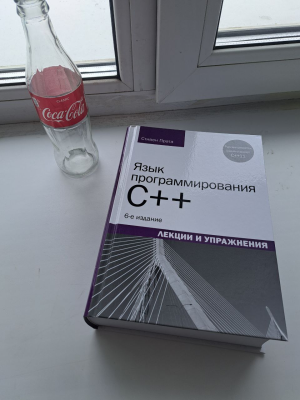

array([[[ 97,  98, 103],
        [ 98,  99, 104],
        [ 96,  97, 102],
        ...,
        [172, 179, 187],
        [172, 179, 187],
        [173, 180, 188]],

       [[ 99, 100, 105],
        [ 97,  98, 103],
        [ 98,  99, 104],
        ...,
        [172, 179, 187],
        [172, 179, 187],
        [173, 180, 188]],

       [[ 98,  99, 104],
        [ 97,  98, 103],
        [ 98,  99, 104],
        ...,
        [172, 179, 187],
        [173, 180, 188],
        [173, 180, 188]],

       ...,

       [[174, 182, 193],
        [174, 182, 193],
        [174, 182, 192],
        ...,
        [142, 149, 155],
        [142, 149, 155],
        [142, 150, 156]],

       [[174, 182, 193],
        [174, 182, 193],
        [174, 182, 193],
        ...,
        [142, 149, 155],
        [142, 149, 155],
        [142, 149, 155]],

       [[174, 182, 193],
        [174, 182, 193],
        [174, 182, 193],
        ...,
        [142, 149, 155],
        [142, 149, 155],
        [142, 149, 155]]], dtype=uint8)
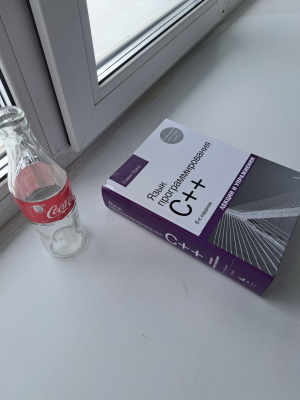

array([[[ 77,  77,  85],
        [ 72,  72,  80],
        [ 67,  67,  75],
        ...,
        [152, 157, 163],
        [151, 156, 162],
        [150, 155, 161]],

       [[ 78,  78,  86],
        [ 74,  74,  82],
        [ 69,  69,  77],
        ...,
        [154, 159, 165],
        [153, 158, 164],
        [153, 158, 164]],

       [[ 80,  80,  88],
        [ 75,  75,  83],
        [ 71,  71,  79],
        ...,
        [155, 160, 166],
        [155, 160, 166],
        [154, 159, 165]],

       ...,

       [[177, 185, 198],
        [177, 185, 198],
        [177, 185, 198],
        ...,
        [139, 146, 154],
        [139, 146, 154],
        [139, 146, 154]],

       [[178, 186, 199],
        [177, 185, 198],
        [176, 184, 198],
        ...,
        [140, 146, 154],
        [139, 146, 154],
        [139, 146, 154]],

       [[177, 185, 198],
        [177, 185, 198],
        [176, 184, 197],
        ...,
        [140, 146, 154],
        [139, 146, 154],
        [139, 146, 154]]], dtype=uint8)
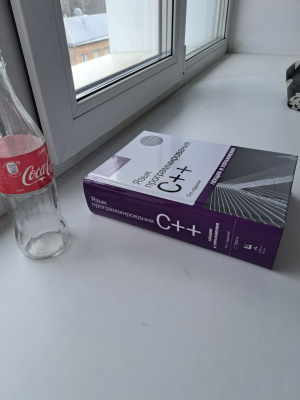

In [111]:
# Создаем новый список для обработанных изображений
images = []

for image in source_images:
    image = cv2.resize(image, (300, 400), interpolation = cv2.INTER_AREA)
    images.append(image.copy())
    display(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

array([[[226, 232, 238],
        [228, 235, 241],
        [230, 237, 243],
        ...,
        [220, 228, 230],
        [221, 229, 232],
        [222, 230, 233]],

       [[228, 235, 241],
        [227, 234, 240],
        [228, 235, 241],
        ...,
        [218, 226, 229],
        [219, 227, 230],
        [220, 228, 231]],

       [[229, 236, 242],
        [228, 235, 241],
        [227, 234, 240],
        ...,
        [221, 229, 232],
        [221, 229, 232],
        [221, 229, 232]],

       ...,

       [[142, 149, 157],
        [142, 149, 157],
        [140, 147, 155],
        ...,
        [129, 137, 140],
        [129, 137, 140],
        [129, 137, 140]],

       [[144, 151, 159],
        [142, 149, 157],
        [140, 147, 155],
        ...,
        [129, 137, 140],
        [129, 137, 140],
        [129, 137, 140]],

       [[140, 147, 155],
        [140, 147, 155],
        [140, 147, 155],
        ...,
        [129, 137, 140],
        [129, 137, 140],
        [129, 137, 140]]], dtype=uint8)
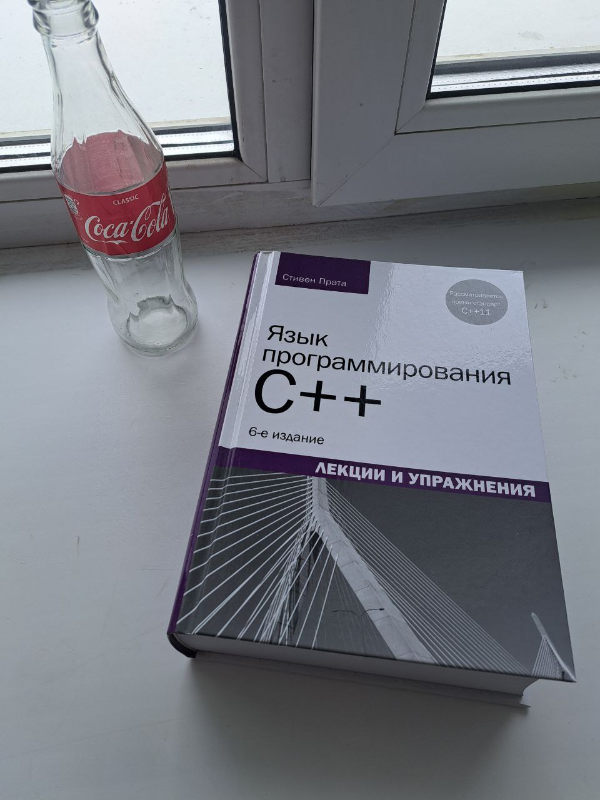

array([[[ 98,  99, 104],
        [ 95,  96, 101],
        [ 98,  99, 104],
        ...,
        [172, 179, 187],
        [173, 180, 188],
        [173, 180, 188]],

       [[ 98,  99, 104],
        [ 96,  97, 102],
        [ 97,  97, 102],
        ...,
        [172, 179, 187],
        [173, 180, 188],
        [173, 180, 188]],

       [[ 99, 100, 105],
        [ 98,  99, 104],
        [ 97,  98, 103],
        ...,
        [173, 180, 188],
        [173, 180, 188],
        [173, 180, 188]],

       ...,

       [[174, 182, 193],
        [174, 182, 193],
        [174, 182, 193],
        ...,
        [142, 149, 155],
        [142, 149, 155],
        [142, 149, 155]],

       [[174, 182, 193],
        [174, 182, 193],
        [174, 182, 193],
        ...,
        [142, 149, 155],
        [142, 149, 155],
        [142, 149, 155]],

       [[174, 182, 193],
        [174, 182, 193],
        [174, 182, 193],
        ...,
        [142, 149, 155],
        [142, 149, 155],
        [142, 149, 155]]], dtype=uint8)
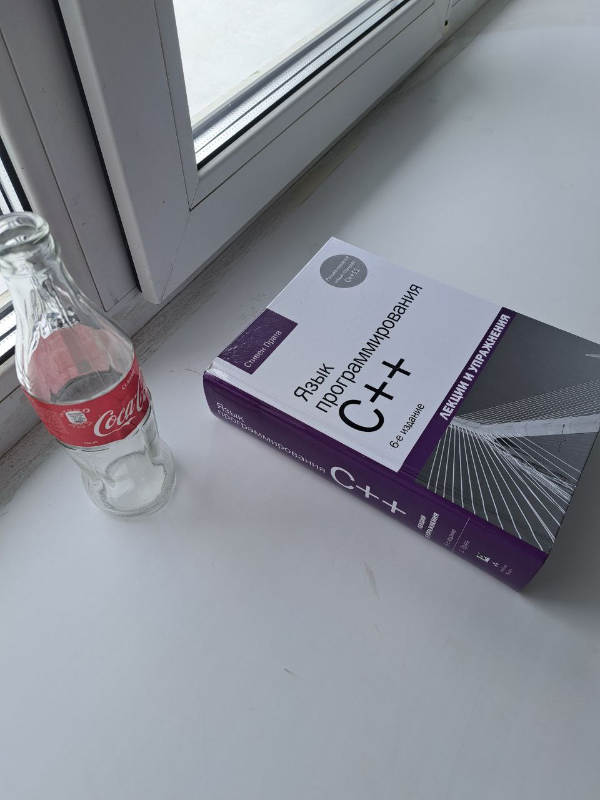

array([[[ 78,  78,  86],
        [ 76,  76,  84],
        [ 73,  73,  81],
        ...,
        [151, 156, 162],
        [150, 155, 161],
        [150, 155, 161]],

       [[ 78,  78,  86],
        [ 76,  76,  84],
        [ 74,  74,  82],
        ...,
        [151, 156, 162],
        [151, 156, 162],
        [151, 156, 162]],

       [[ 79,  79,  87],
        [ 77,  77,  85],
        [ 75,  75,  83],
        ...,
        [153, 158, 164],
        [152, 157, 163],
        [152, 157, 163]],

       ...,

       [[179, 187, 200],
        [178, 186, 199],
        [177, 185, 198],
        ...,
        [139, 146, 154],
        [139, 146, 154],
        [139, 146, 154]],

       [[178, 186, 199],
        [178, 186, 199],
        [177, 185, 198],
        ...,
        [139, 146, 154],
        [139, 146, 154],
        [139, 146, 154]],

       [[176, 184, 197],
        [177, 185, 198],
        [177, 185, 198],
        ...,
        [139, 146, 154],
        [139, 146, 154],
        [139, 146, 154]]], dtype=uint8)
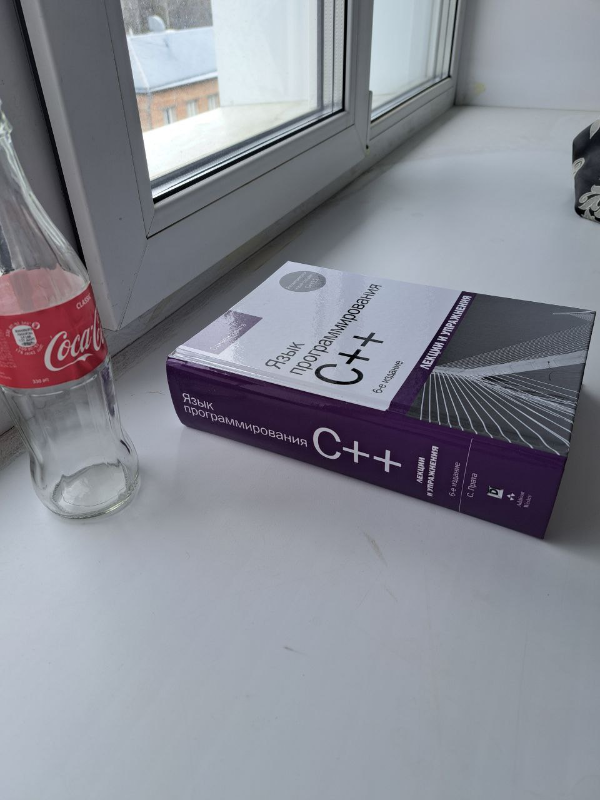

In [112]:
# Создаем новый список для обработанных изображений
images = []

for image in source_images:
    image = cv2.resize(image, (600, 800))
    images.append(image.copy())
    display(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

images_gray = []
for image in images:
  images_gray.append(cv2.cvtColor(image, cv2.COLOR_RGB2GRAY))

In [113]:
display(
    images_gray[0].shape,
    type(images_gray[0]),
    images_gray[0].dtype,
)

(800, 600)

numpy.ndarray

dtype('uint8')

# <font color='#F5DEB3'>2. Функции


### Расширение изображения для обработки

In [114]:
# Добавление дополнительных пикселей вокруг исходного изображения перед применением операций свертки или фильтрации.

def pad_image(image, kernel, mode_pad ='reflect') -> np.ndarray:

    if kernel is None:
        raise ValueError("Ядро не найдено")

    kernel_size = kernel.shape[0]

    pad = kernel_size // 2
    pad_channel = np.pad(
        array = image,
        pad_width = ((pad, pad), (pad, pad)),
        mode = mode_pad
    )

    return pad_image

### Фильтр Гаусса

In [115]:
def gaussian_filter(image, kernel) -> np.ndarray:

    kernel_height, kernel_width = kernel.shape
    padding_y = kernel_height // 2
    padding_x = kernel_width // 2

    padded_image = np.pad(
        array = image,
        pad_width = ((padding_y, padding_y), (padding_x, padding_x)),
        mode = 'constant'
    )

    # Обрабатываем каждый канал отдельно
    gaussian_image = np.zeros_like(image)

    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            region = padded_image[i:i + kernel_height, j:j + kernel_width]
            gaussian_image[i, j] = np.sum(region * kernel)

    return gaussian_image

### Выравнивание яркости

In [116]:
#    Выравнивает яркость исходного изображения относительно эталонного
#    на основе среднего значения и стандартного отклонения.

def brightness_align(image, reference):

    # Вычисляем среднее значение и стандартное отклонение для обоих изображений
    mean_image, std_image = np.mean(image), np.std(image)
    mean_reference, std_reference = np.mean(reference), np.std(reference)

    # Применяем линейное преобразование для выравнивания яркости
    image_ret = (std_reference / std_image) * (image - mean_image) + mean_reference

    # Обрезаем значения до допустимого диапазона [0, 255]
    image_ret = np.clip(image_ret, 0, 255).astype(np.uint8)

    return image_ret

### Детектор Харриса

Харрис и Стефенс улучшили детектор Моравеца (Moravec), введя анизотропию по всем направлениям, т.е. рассматривают производные яркости изображения для исследования изменений яркости по множеству направлений. Они вводят в рассмотрение производные по некоторым принципиальным направлениям.

**Детектор Моравеца** – самый простой из существующих. Автор рассматривает изменение яркости квадратного окна W (обычно размера 3х3, 5х5, 7х7 пикселей) относительно интересующей точки при сдвиге окна W на 1 пиксель в 8-ми направлениях (горизонтальных, вертикальных и диагональных).

Взвешенная сумма квадрата разностей:
![image.png](https://habrastorage.org/r/w1560/files/68b/9ce/118/68b9ce1189b34b698309a7d70414a913.png)

где w(x,y) – весовая функция (обычно используется функция Гаусса или бинарное окно).

![image.png](https://habrastorage.org/r/w1560/files/b06/ae8/34c/b06ae834c0c34fa588961baa95fa8610.png)

M – автокорреляционная матрица:

![image.png](https://habrastorage.org/files/a29/58a/acb/a2958aacbe3b49feae98047cf8f9cd69.png)

Угол характеризуется большими изменениями функции E(x,y) по всем возможным направлениям (x,y), что эквивалентно большим по модулю собственным значениям матрицы M. Расположение собственных значений приведено на следующем рисунке.
![image.png](https://habrastorage.org/r/w1560/files/487/859/f3d/487859f3d0e6455cb2b62baad30220c1.png)

Поскольку напрямую считать собственные значения является трудоёмкой задачей, Харрисом и Стефеном была предложена мера отклика:
![image.png](https://habrastorage.org/r/w1560/files/fe8/119/9a8/fe81199a88d1413b98123860db3d37a9.png)

где k – эмпирическая константа, ![image.png](https://habrastorage.org/r/w1560/files/0bb/4e2/9df/0bb4e29dfed948d6bab28aee61fc366a.png)

***det(M)*** - модуль матрицы М; ***tr(M)*** - сумма собственных чисел матрицы М.

Таким образом, значение R положительно для угловых особых точек. Затем производится отсечение точек по найденному порогу R (т.е. те точки, у которых значение R меньше некоторого порога, исключаются из рассмотрения).

Ссылка на статью: https://habr.com/ru/articles/244541/

In [130]:
def harris_corner_detector(image) -> list:

    k = 0.04
    threshold = 0.001

    # Вычисление градиентов по x и y
    Ix = np.gradient(image, axis=1)
    Iy = np.gradient(image, axis=0)

    # Вычисление элементов матрицы М (структурного тензора)
    Ix2 = Ix ** 2
    Iy2 = Iy ** 2
    Ixy = Ix * Iy

    # Размытие для учета локальной окрестности
    kernel_size = 3
    sigma = 2

    # Размытие гауссовым ядром
    ax = np.linspace(-(kernel_size // 2), kernel_size // 2, kernel_size)
    xx, yy = np.meshgrid(ax, ax)
    kernel = np.exp(-(xx**2 + yy**2) / (2 * sigma**2))
    kernel /= np.sum(kernel)

    Ix2_blur = gaussian_filter(Ix2, kernel)
    Iy2_blur = gaussian_filter(Iy2, kernel)
    Ixy_blur = gaussian_filter(Ixy, kernel)

    # Вычисление углового отклика R для каждого пикселя
    det_M = Ix2_blur * Iy2_blur - Ixy_blur ** 2
    trace_M = Ix2_blur + Iy2_blur
    R = det_M - k * (trace_M ** 2)

    # Применение порога для выбора углов
    R_max = np.max(R)
    corners = R > threshold * R_max # берутся только те пиксели, где отклик превышает долю от максимального

    # Преобразование найденных углов в формат cv2.KeyPoint
    keypoints = []
    for y, x in np.argwhere(corners):  # Получаем координаты всех углов
        keypoints.append(cv2.KeyPoint(x=float(x), y=float(y), size=1, angle=0))  # Создаем KeyPoint

    return keypoints

###  Дескриптор SIFT

**Дескриптор** – идентификатор особой точки, выделяющий её из остального множества особых точек. В свою очередь, дескрипторы должны обеспечивать инвариантность нахождения соответствия между особыми точками относительно преобразований изображений.

Источник: https://habr.com/ru/articles/106302/

В методе SIFT дескриптором является вектор. Как и направление ключевой точки, дескриптор вычисляется на гауссиане, ближайшем по масштабу к ключевой точке, и исходя из градиентов в некотором окне ключевой точки. Перед вычислением дескриптора это окно поворачивают на угол направления ключевой точки, чем и достигается инвариантность относительно поворота.

![image.png](https://habrastorage.org/r/w780/storage/habraeffect/fe/6b/fe6b57079b5e7a2f195173ad982ecccc.png)


In [118]:
def compute_sift_descriptor(image, keypoints):

    patch_size=16
    num_orientation_bins=8
    descriptors = []
    image = image.astype(np.float32)

    # Вычисление градиентов по x и y
    dx = cv2.Sobel(image, cv2.CV_32F, 1, 0, ksize=3)
    dy = cv2.Sobel(image, cv2.CV_32F, 0, 1, ksize=3)
    magnitude = np.sqrt(dx ** 2 + dy ** 2)                  # Модуль градиента
    orientation = np.arctan2(dy, dx) * (180 / np.pi) % 360  # Угол в градусах [0, 360)

    for keypoint in keypoints:
        x, y = keypoint.pt
        x, y = int(x), int(y)
        half_size = patch_size // 2

        # Проверка выхода за границы
        if (x - half_size < 0 or x + half_size >= image.shape[1] or
            y - half_size < 0 or y + half_size >= image.shape[0]):
            descriptors.append(np.zeros(128))
            continue

        patch_magnitude = magnitude[y - half_size:y + half_size, x - half_size:x + half_size]
        patch_orientation = orientation[y - half_size:y + half_size, x - half_size:x + half_size]

        cell_size = patch_size // 4
        descriptor = []

        # Разбиение патча на ячейки и построение гистограмм ориентаций
        for i in range(4):
            for j in range(4):
                cell_magnitude = patch_magnitude[i * cell_size:(i + 1) * cell_size, j * cell_size:(j + 1) * cell_size]
                cell_orientation = patch_orientation[i * cell_size:(i + 1) * cell_size, j * cell_size:(j + 1) * cell_size]

                hist, _ = np.histogram(cell_orientation, bins=num_orientation_bins, range=(0, 360), weights=cell_magnitude)
                descriptor.extend(hist)

        # Нормализуем дескриптор
        descriptor = np.array(descriptor, dtype=np.float32)
        descriptor /= np.linalg.norm(descriptor) + 1e-8  # Нормализация
        descriptor = np.clip(descriptor, 0, 0.2)  # ограничиваются сверху значения до 0.2
        descriptor /= np.linalg.norm(descriptor) + 1e-8  # Повторная нормализация

        descriptors.append(descriptor)

    return np.array(descriptors)

### Нахождение соответствий

1. Вычисление Евклидова расстояния
Используется формула Евклидова расстояния:

     ![image.png](https://ic.pics.livejournal.com/yu_xuan/12681078/223220/223220_original.png)

2. Сортировка расстояний :
Расстояния сортируются по возрастанию, чтобы найти два ближайших соседа (тест Лоу)
Если расстояние до ближайшего соседа (m_distance) значительно меньше, чем расстояние до второго ближайшего соседа (n_distance), то соответствие считается хорошим.

In [119]:
def match_descriptors(descriptors1, descriptors2, ):

    ratio_threshold = 0.75  # Порог для фильтрации соответствий

    matches = []

    # Вычисление Евклидова расстояния между всеми парами дескрипторов
    for i, desc1 in enumerate(descriptors1):
        distances = np.linalg.norm(descriptors2 - desc1, axis=1)  # Расстояния до всех дескрипторов второго набора
        sorted_indices = np.argsort(distances)  # Индексы отсортированных расстояний
        m_distance = distances[sorted_indices[0]]  # Расстояние до ближайшего соседа
        n_distance = distances[sorted_indices[1]]  # Расстояние до второго ближайшего соседа

        # Тест Лоу (Low Ratio Test)
        if m_distance < ratio_threshold * n_distance:
            matches.append((i, sorted_indices[0]))  # Сохраняем индексы соответствующих дескрипторов

    return matches

### Оценка трансформаций

1. Для каждой пары соответствующих между собой точек преобразуем их в координаты.

2. Находим центры масс для обоих наборов точек. Вычитаем центры масс из координат точек. Это необходимо, чтобы устранить влияние сдвига при вычислении поворота.

3. Вычесляем матрицу ковариации H как произведение центрированных точек.

4. Выполняем сингулярное разложение матрицы ковариации. Разложение по сингулярным числам используется для нахождения матрицы поворота R.

5. Угол поворота вычисляется из матрицы R. Матрица поворота получается как произведение транспонированных матриц из SVD.

6. Вектор сдвига вычисляется как разница между центрами масс после применения поворота.

7. Создаем матрицу преобразования размером 2x3:
    - В левой части 2x2 записываем матрицу поворота
    - В правом столбце записываем вектор сдвига

In [120]:
def estimate_transformation(matches, keypoints1, keypoints2):

    # Извлечение координат соответствующих точек
    points1 = np.array([keypoints1[m[0]].pt for m in matches])
    points2 = np.array([keypoints2[m[1]].pt for m in matches])

    # Центрируем точки вокруг их центров масс
    centroid1 = np.mean(points1, axis=0)
    centroid2 = np.mean(points2, axis=0)
    # Вычитаем центр масс.
    centered_points1 = points1 - centroid1
    centered_points2 = points2 - centroid2

    # Вычисляем матрицу ковариации
    H = np.dot(centered_points1.T, centered_points2)

    # Разложение по сингулярным числам (SVD)
    U, S, Vt = np.linalg.svd(H)

    # Матрица поворота (перемножение правых и левых сингулярных векторов)
    R = np.dot(Vt.T, U.T)

    # Расчёт вектора сдвига
    t = centroid2 - np.dot(R, centroid1)

    # Формируем матрицу 2x3 преобразования
    transformation_matrix = np.zeros((2, 3))
    transformation_matrix[:2, :2] = R
    transformation_matrix[:, 2] = t

    return transformation_matrix

### Отрисовка движения камеры

In [121]:
import matplotlib.pyplot as plt

def draw(image1, keypoints1, image2, keypoints2, matches):

    # Объединяем изображения горизонтально
    h1, w1 = image1.shape
    h2, w2 = image2.shape
    combined_image = np.zeros((max(h1, h2), w1 + w2), dtype=np.uint8)
    combined_image[:h1, :w1] = image1
    combined_image[:h2, w1:] = image2

    # Создаем фигуру для отображения
    fig, ax = plt.subplots(1, 1, figsize=(15, 10))
    ax.imshow(combined_image, cmap='gray')

    # Рисуем линии между соответствующими точками
    for idx1, idx2 in matches:
        pt1 = keypoints1[idx1].pt  # Координаты точки на первом изображении
        pt2 = keypoints2[idx2].pt  # Координаты точки на втором изображении
        x1, y1 = pt1
        x2, y2 = pt2[0] + w1, pt2[1]  # Сдвигаем координаты второй точки по ширине изображения
        ax.plot([x1, x2], [y1, y2], color='red', linewidth=1)

    # Настройка графика
    ax.axis('off')
    plt.title("Соответствия между ключевыми точками")
    plt.show()

# <font color='#F5DEB3'>3. Основная часть работы

## Выравнивание яркости изображений

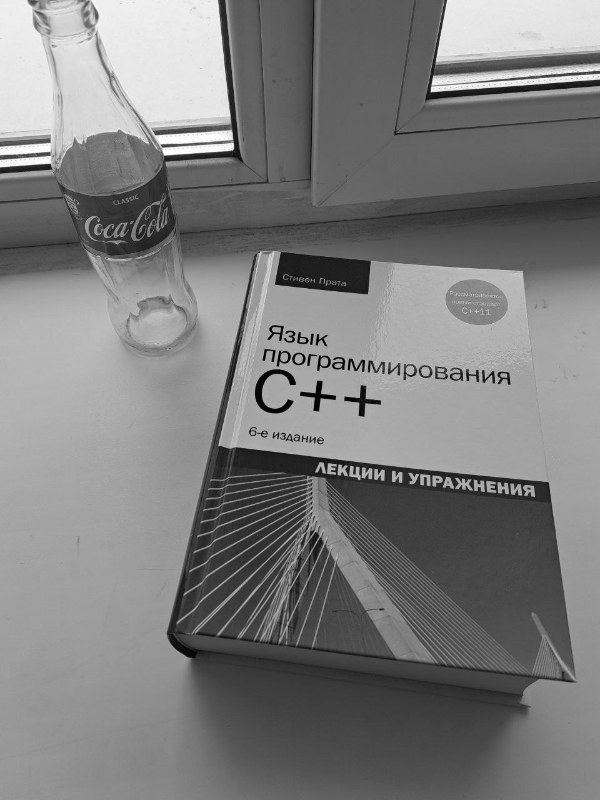

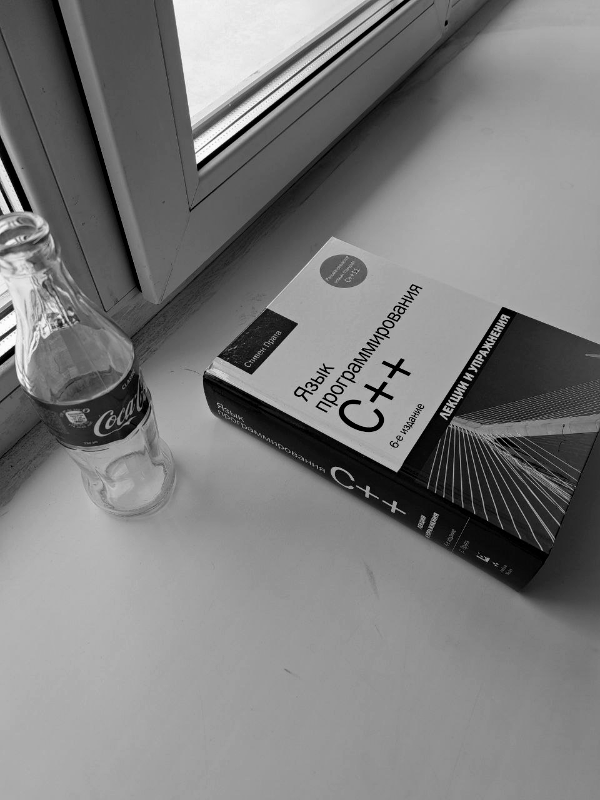

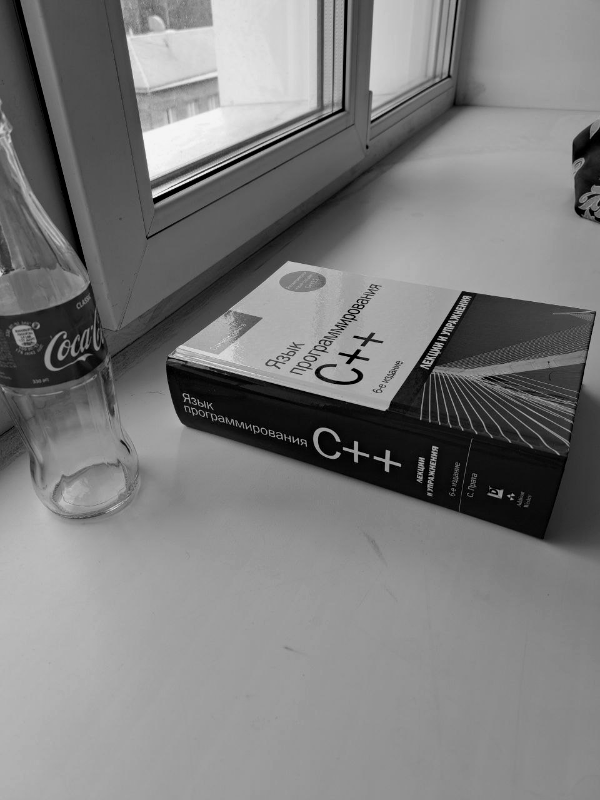

In [132]:
image_reference = images_gray[0]

images_align = []
for image in images_gray:
  image_align = brightness_align(image, image_reference)
  images_align.append(image_align)
  cv2_imshow(image_align)

## Поиск и сопостовление ключевых точек

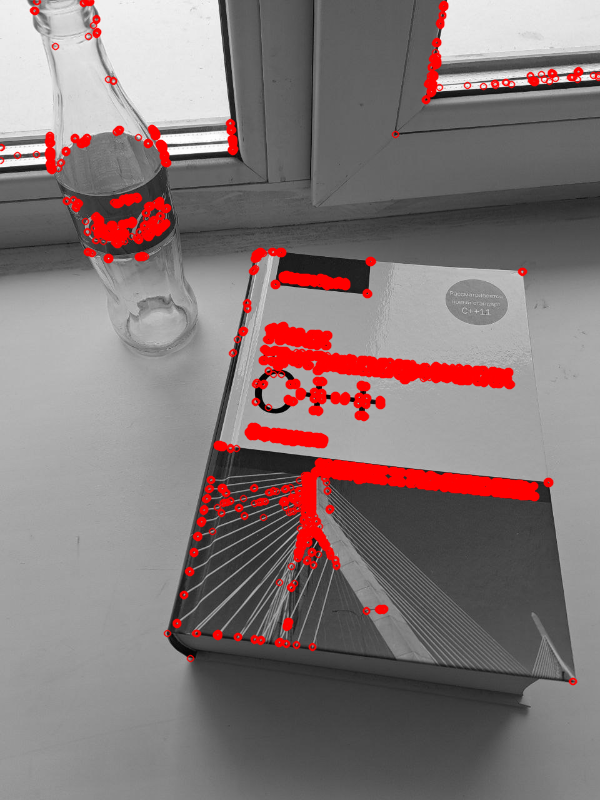

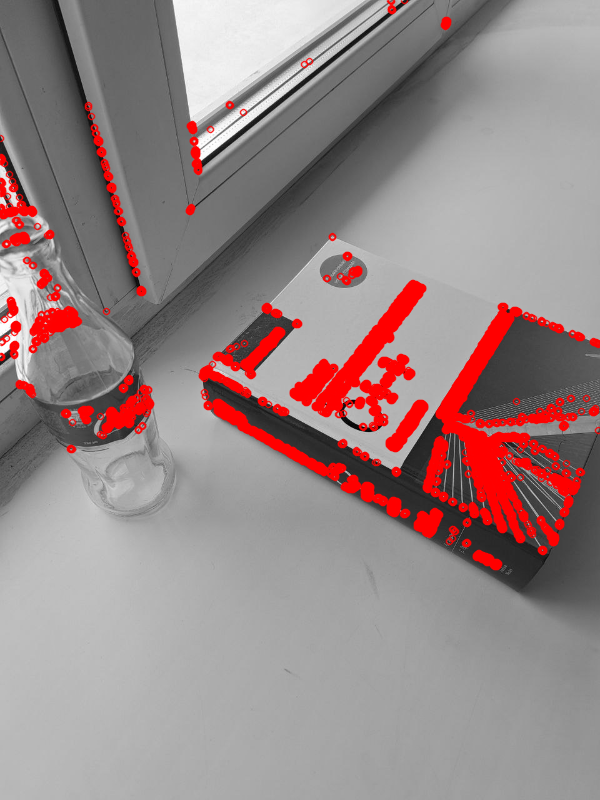

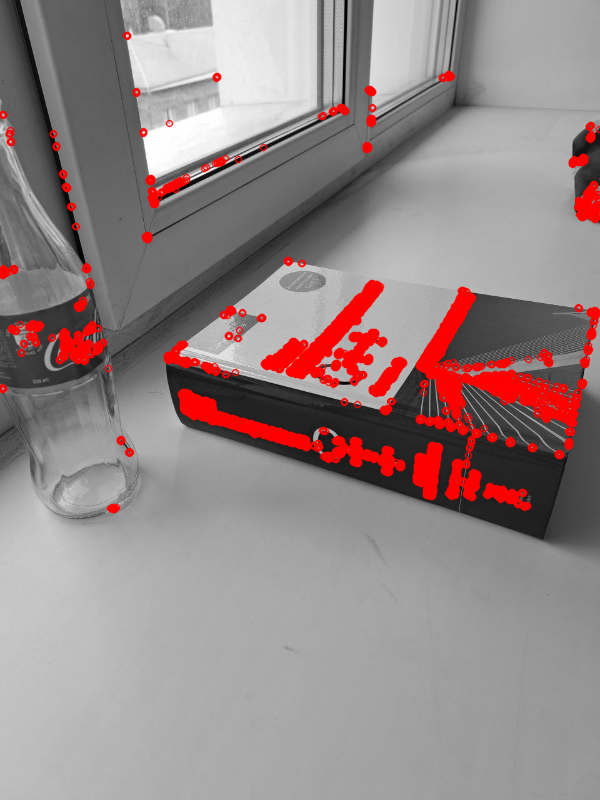

In [128]:
keypoints = []
for image in images_gray:
    harris_points = harris_corner_detector(image)
    keypoints.append(harris_points)
    output_image = cv2.drawKeypoints(image, harris_points, None, color=(0, 0, 255))  # Рисуем углы
    cv2_imshow(output_image)

В итоге получается следующая схема решения задачи сопоставления изображений:
1. На изображениях выделяются ключевые точки и их дескрипторы.
2. По совпадению дескрипторов выделяются соответствующие друг другу ключевые точки.
3. На основе набора совпавших ключевых точек строится модель преобразования изображений, с помощью которого из одного изображения можно получить другое.

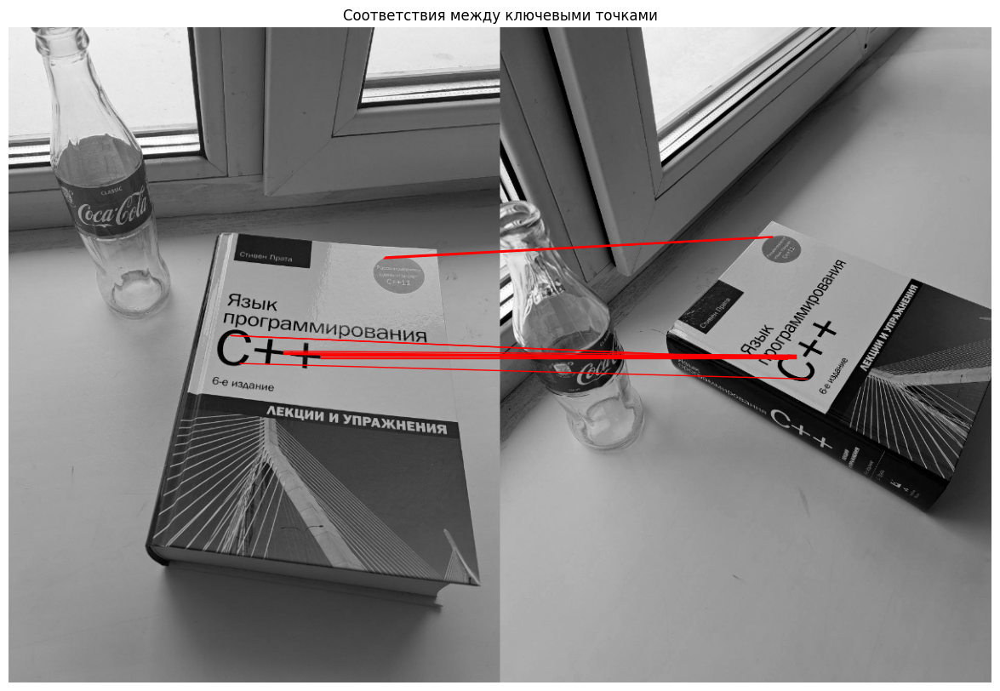

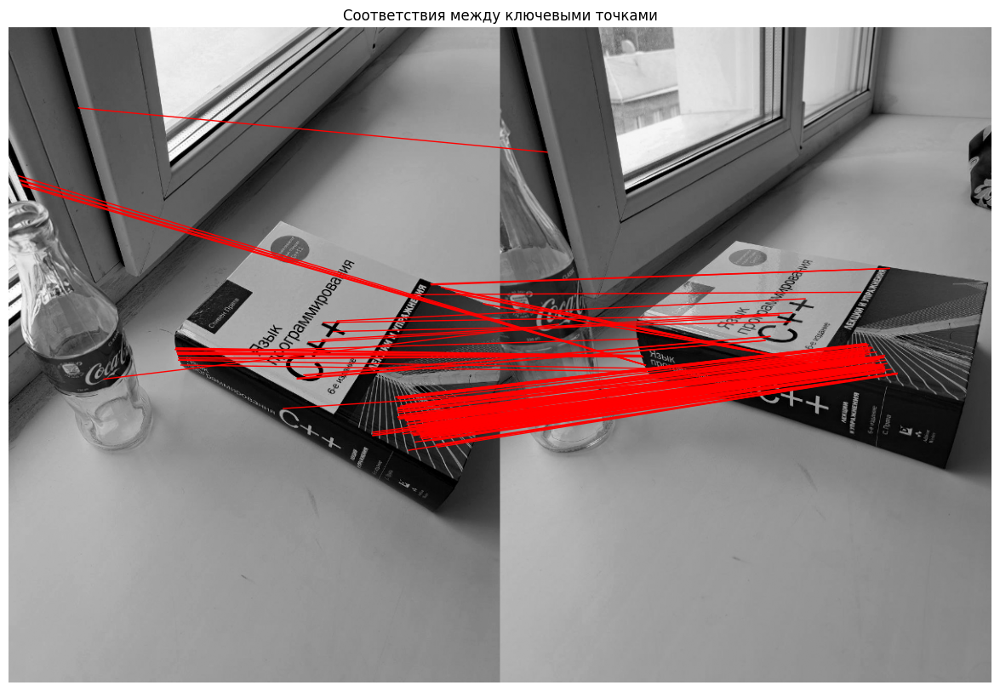

In [133]:
# Инициализация данных
image_i = images_gray[0]
transformations = []

for image in images_gray[1:]:

    # Выравнивание яркости
    image = brightness_align(image, image_i)

    # Обнаружение ключевых точек
    keypoints = harris_corner_detector(image)
    keypoints_i = harris_corner_detector(image_i)

    # Дескрипторы
    descriptors = compute_sift_descriptor(image, keypoints)
    descriptors_i = compute_sift_descriptor(image_i, keypoints_i)

    # Сопоставление ключевых точек
    matches = match_descriptors(descriptors_i, descriptors)

    # Визуализация текущей пары
    match_image = draw(
        image_i, keypoints_i,
        image, keypoints,
        matches)

    transformation = estimate_transformation(matches, keypoints_i, keypoints)
    transformations.append(transformation)

    image_i = image

## Пострение траектории

### Траектория движения камеры

In [134]:
def compute_trajectory(transformations):
    trajectory = [np.array([0, 0])]
    current_position = np.array([0., 0.])  # Начальная позиция камеры

    for transformation in transformations:

        # Извлечение сдвига из матрицы преобразования
        translation = transformation[:, 2]

        # Обновление позиции камеры
        current_position += translation

        trajectory.append(-current_position.copy())

    return np.array(trajectory)

Траектория движения камеры: [[   0.            0.        ]
 [ 152.30829754 -485.8071761 ]
 [ 315.19401161 -617.1207134 ]]


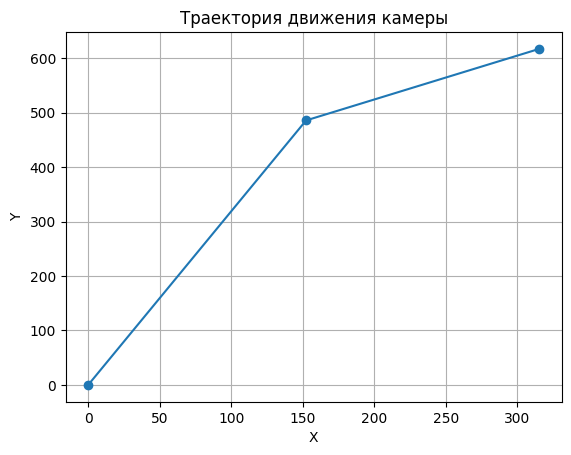

In [135]:
# Построение траектории
trajectory = compute_trajectory(transformations)

# Принт траектории
print("Траектория движения камеры:", trajectory)

# Построение траектории на графике
trajectory = np.array(trajectory)
plt.plot(trajectory[:, 0], -trajectory[:, 1], marker='o')
plt.title("Траектория движения камеры")
plt.xlabel("X")
plt.ylabel("Y")
plt.grid(True)
plt.show()